# Assignment No-14-Decision Tree

# 1)Company_Data

# Problem Statement
Decision Tree
 
Assignment


About the data: 
Let’s consider a Company dataset with around 10 variables and 400 records. 
The attributes are as follows: 
 Sales -- Unit sales (in thousands) at each location
 Competitor Price -- Price charged by competitor at each location
 Income -- Community income level (in thousands of dollars)
 Advertising -- Local advertising budget for company at each location (in thousands of dollars)
 Population -- Population size in region (in thousands)
 Price -- Price company charges for car seats at each site
 Shelf Location at stores -- A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site
 Age -- Average age of the local population
 Education -- Education level at each location
 Urban -- A factor with levels No and Yes to indicate whether the store is in an urban or rural location
 US -- A factor with levels No and Yes to indicate whether the store is in the US or not
The company dataset looks like this: 
 
Problem Statement:
A cloth manufacturing company is interested to know about the segment or attributes causes high sale. 
Approach - A decision tree can be built with target variable Sale (we will first convert it in categorical variable) & all other variable will be independent in the analysis.

In [1]:
#importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import LabelEncoder#for encoding
from sklearn.model_selection import train_test_split#for train test splitting
from sklearn.tree import DecisionTreeClassifier#for decision tree object
from sklearn.metrics import classification_report, confusion_matrix#for checking testing results
from sklearn.tree import plot_tree#for visualizing tree 

In [3]:
#Import DataSet

In [4]:
company_data=pd.read_csv("D:\ExcelR Solution\Data Science\Assignments\Assignment No-14-Decision Trees\Company_Data.csv")

In [5]:
company_data

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [6]:
company_data.shape

(400, 11)

In [7]:
company_data.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No


In [8]:
company_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [9]:
company_data.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


In [10]:
company_data.dtypes

Sales          float64
CompPrice        int64
Income           int64
Advertising      int64
Population       int64
Price            int64
ShelveLoc       object
Age              int64
Education        int64
Urban           object
US              object
dtype: object

In [11]:
company_data.isna().sum()

Sales          0
CompPrice      0
Income         0
Advertising    0
Population     0
Price          0
ShelveLoc      0
Age            0
Education      0
Urban          0
US             0
dtype: int64

In [12]:
company_data.isnull().any()

Sales          False
CompPrice      False
Income         False
Advertising    False
Population     False
Price          False
ShelveLoc      False
Age            False
Education      False
Urban          False
US             False
dtype: bool

In [13]:
corr=company_data.corr()

In [14]:
corr

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
Sales,1.000000,0.064079,0.151951,0.269507,0.050471,-0.444951,-0.231815,-0.051955
CompPrice,0.064079,1.000000,-0.080653,-0.024199,-0.094707,0.584848,-0.100239,0.025197
Income,0.151951,-0.080653,1.000000,0.058995,-0.007877,-0.056698,-0.004670,-0.056855
Advertising,0.269507,-0.024199,0.058995,1.000000,0.265652,0.044537,-0.004557,-0.033594
Population,0.050471,-0.094707,-0.007877,0.265652,1.000000,-0.012144,-0.042663,-0.106378
Price,-0.444951,0.584848,-0.056698,0.044537,-0.012144,1.000000,-0.102177,0.011747
Age,-0.231815,-0.100239,-0.004670,-0.004557,-0.042663,-0.102177,1.000000,0.006488
Education,-0.051955,0.025197,-0.056855,-0.033594,-0.106378,0.011747,0.006488,1.000000


In [15]:
company_data.columns

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'ShelveLoc', 'Age', 'Education', 'Urban', 'US'],
      dtype='object')

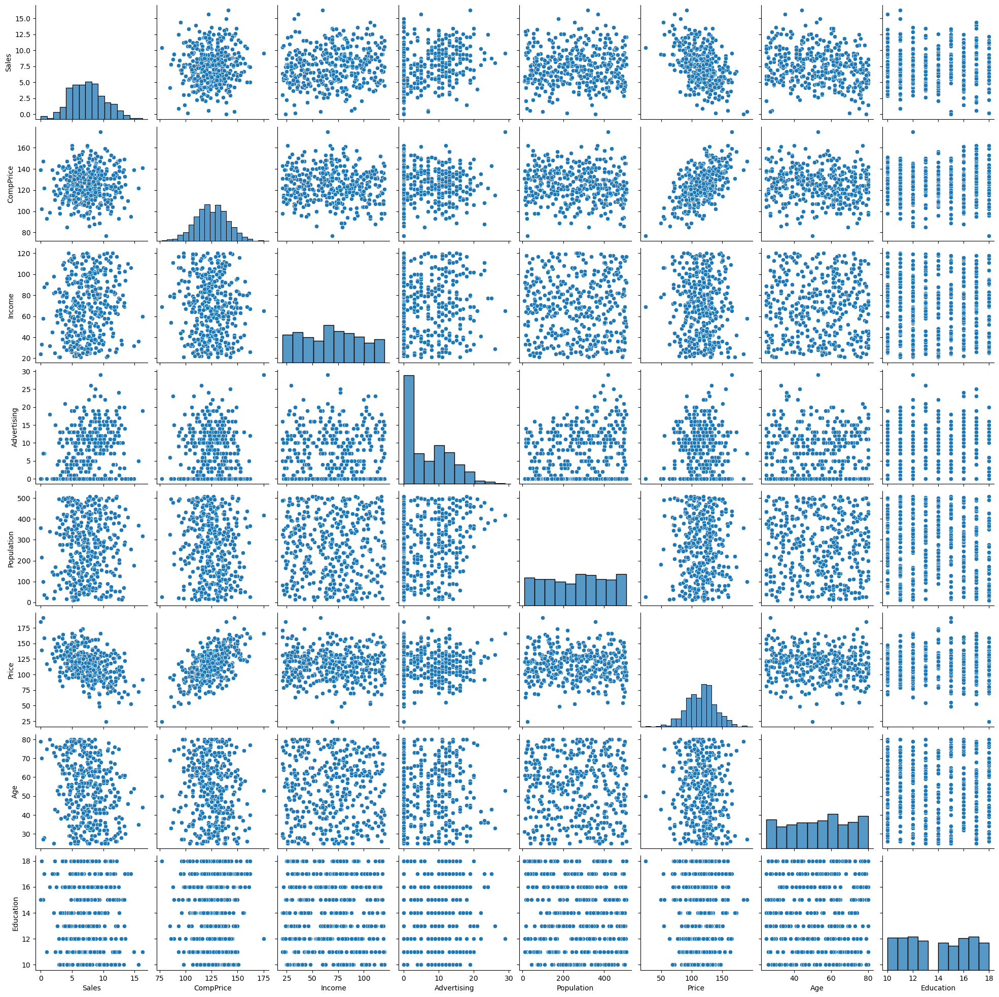

In [16]:
sns.pairplot(data=company_data)

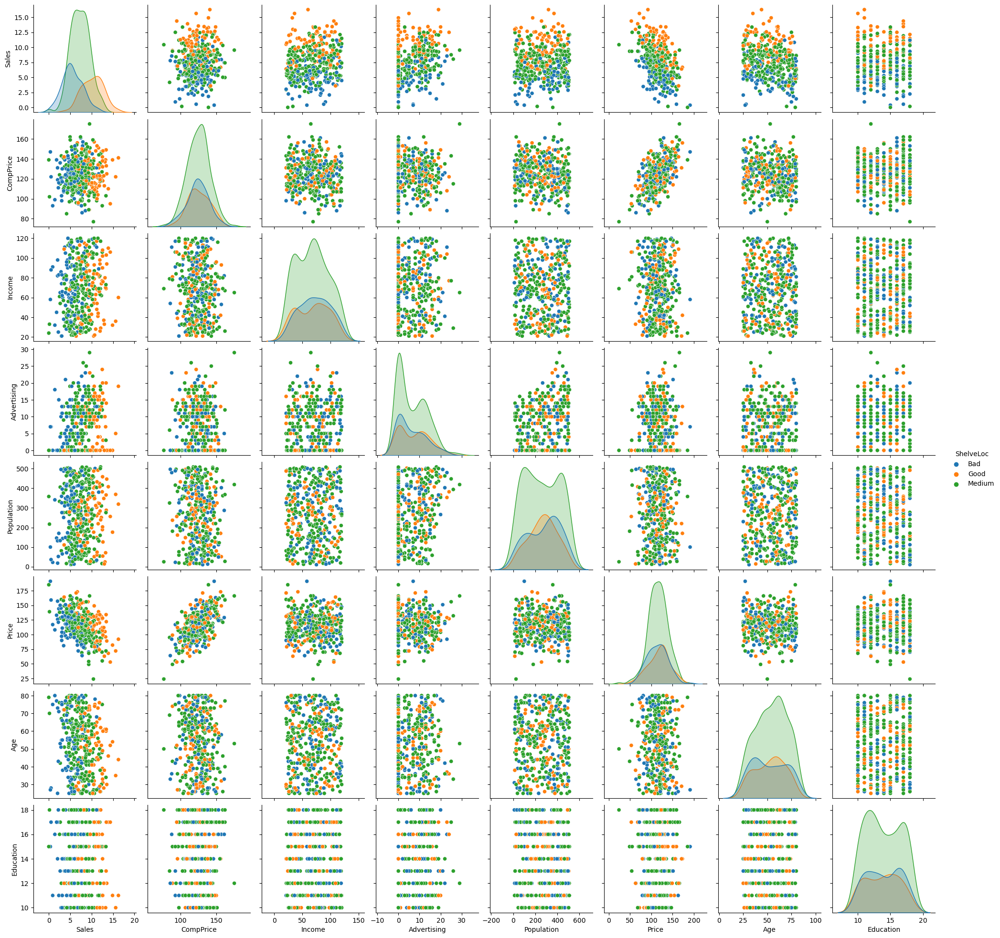

In [17]:
# let's plot pair plot to visualise the attributes all at once
sns.pairplot(data=company_data, hue = 'ShelveLoc')

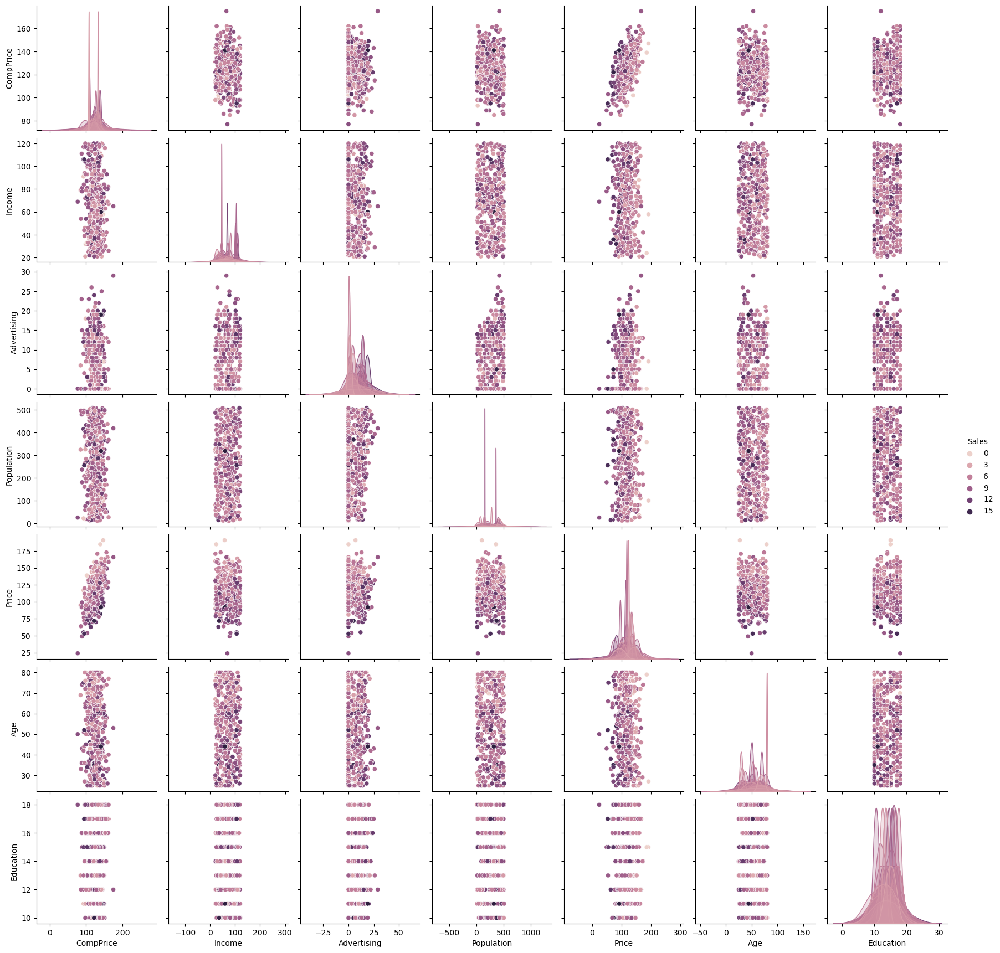

In [18]:
sns.pairplot(data=company_data,hue='Sales')

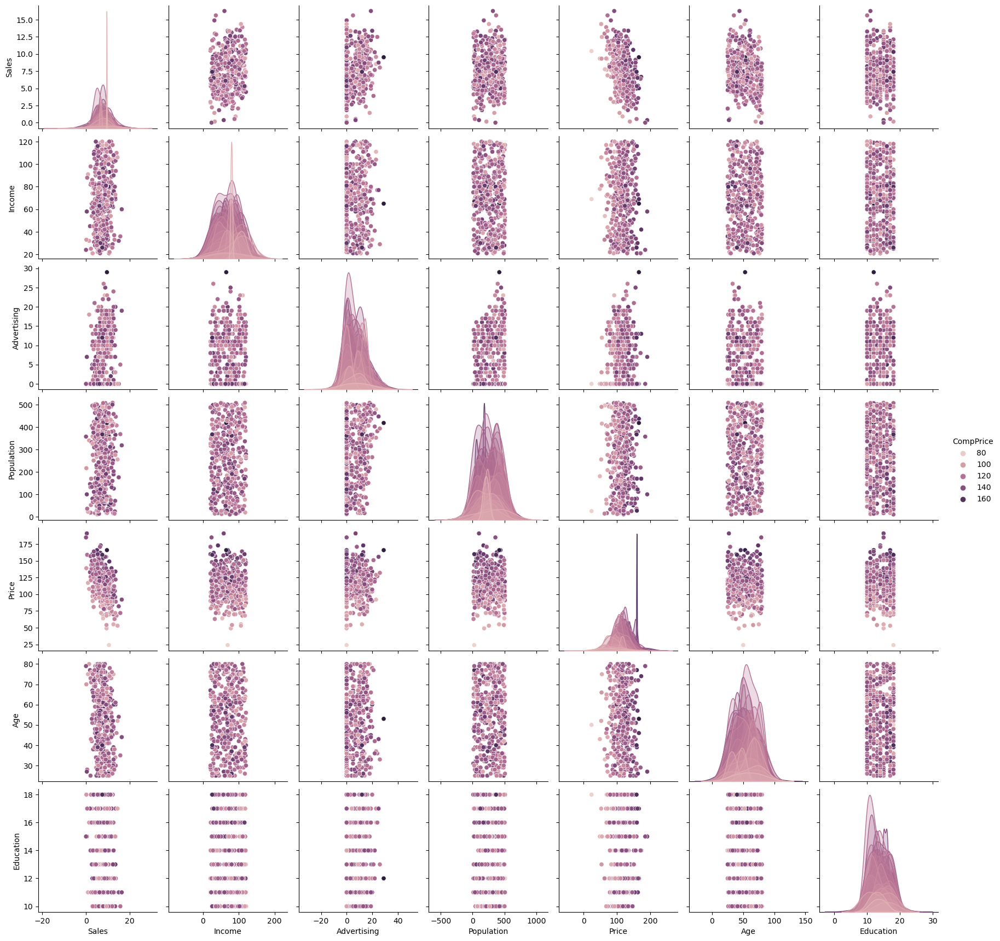

In [19]:
sns.pairplot(data=company_data,hue='CompPrice')

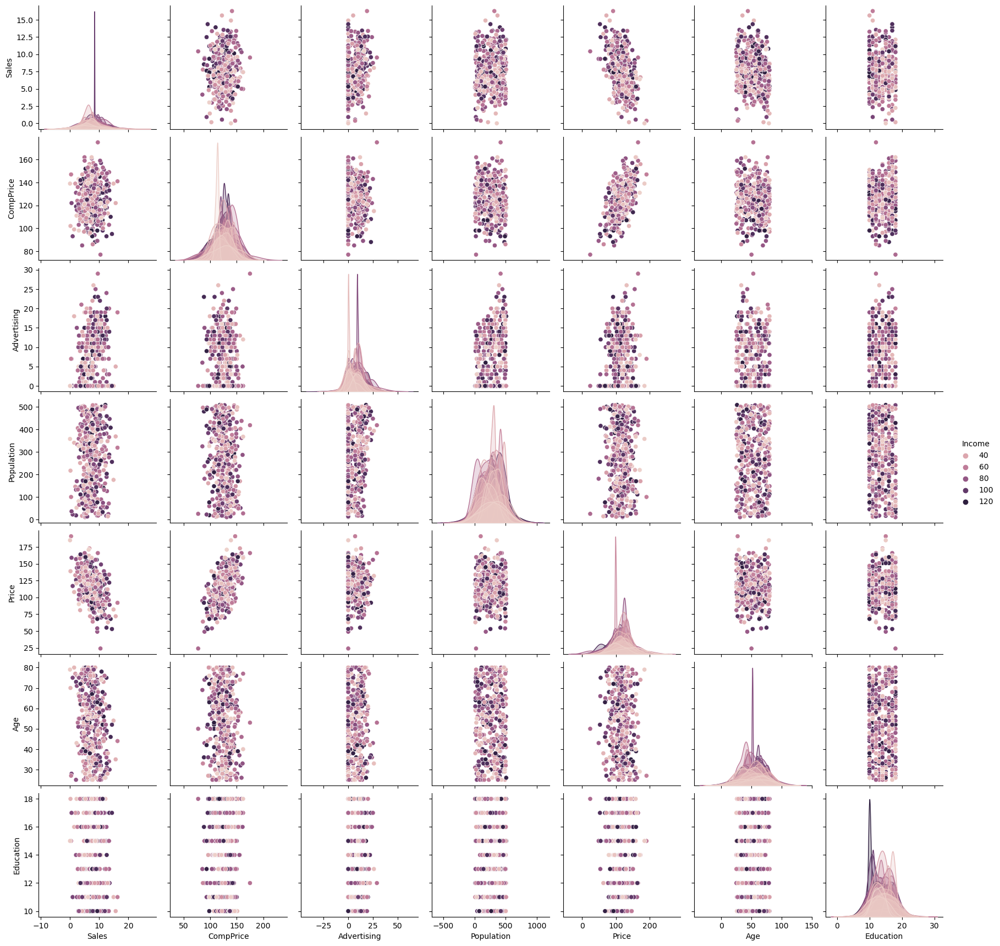

In [20]:
sns.pairplot(data=company_data,hue='Income')

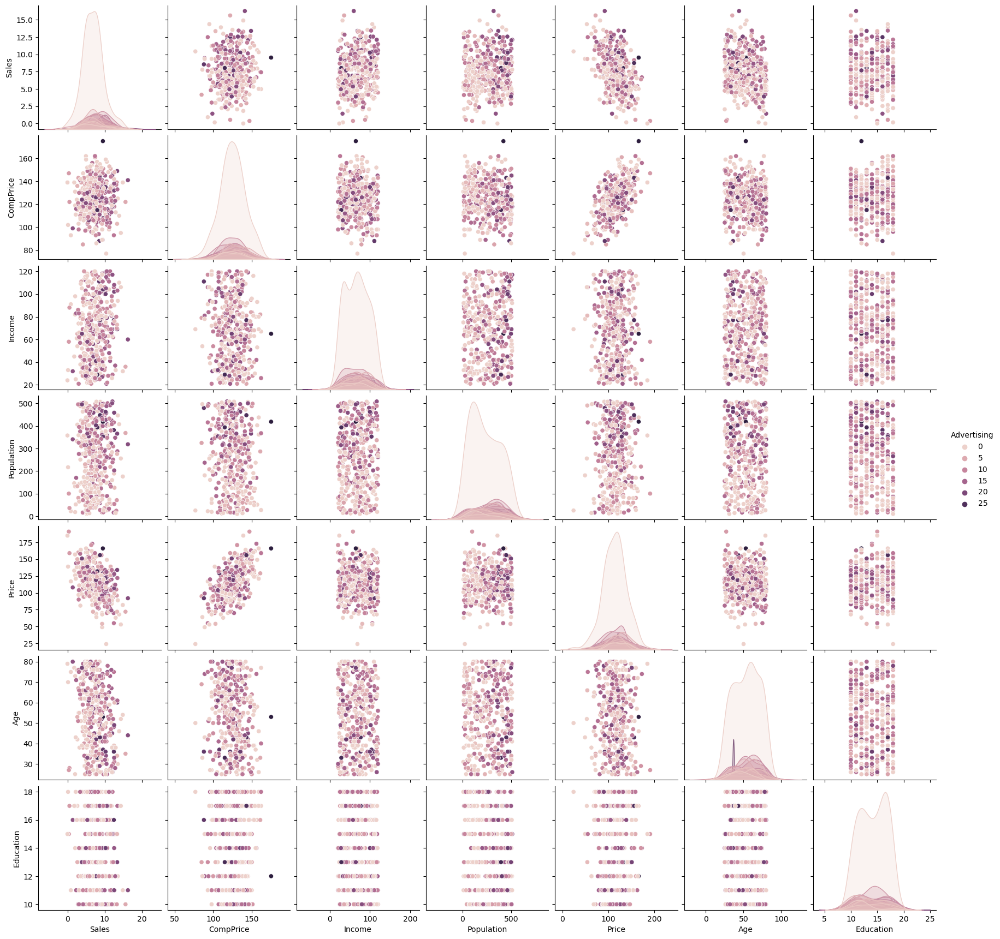

In [21]:
sns.pairplot(data=company_data,hue='Advertising')

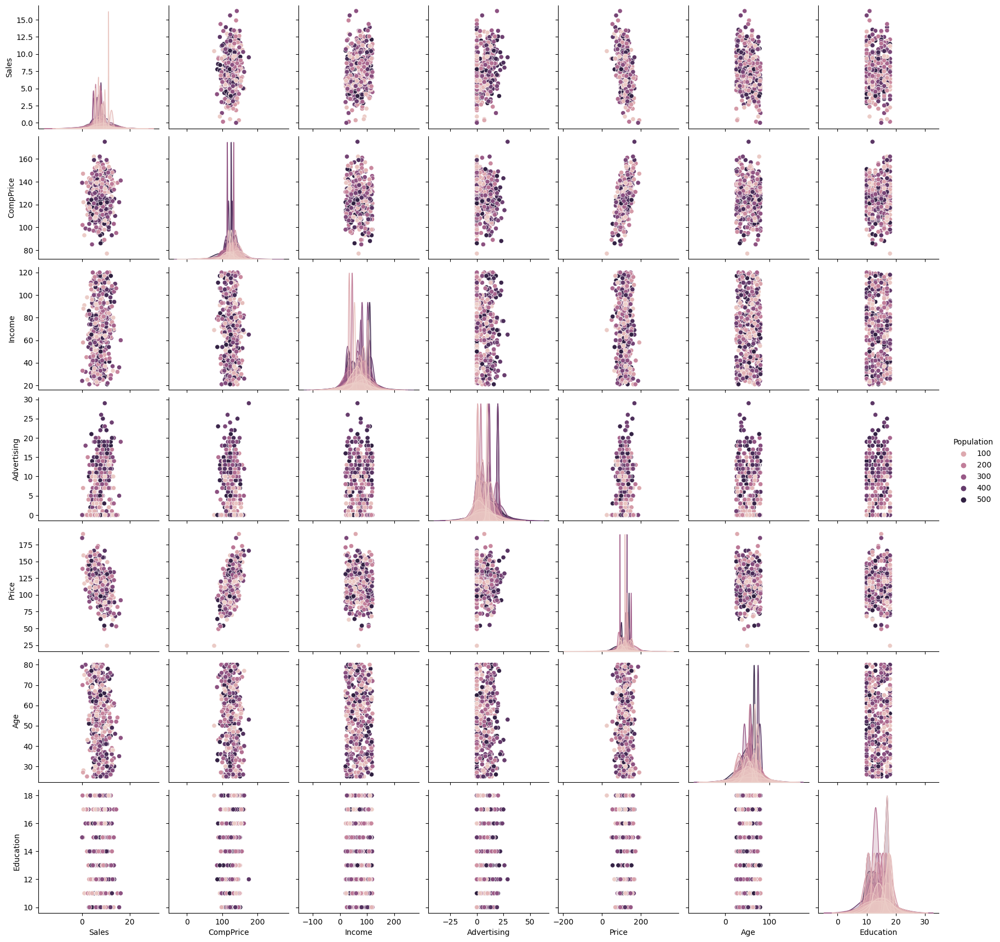

In [22]:
sns.pairplot(data=company_data,hue='Population')

<AxesSubplot:xlabel='CompPrice', ylabel='Population'>

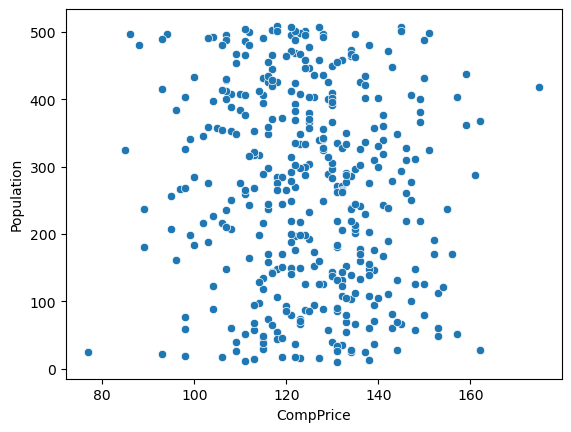

In [23]:
sns.scatterplot(data=company_data,x='CompPrice',y='Population')

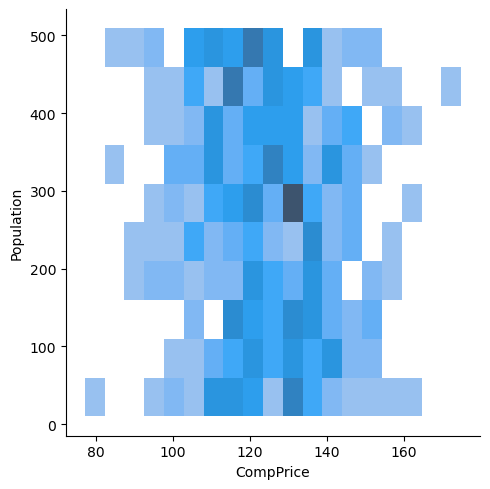

In [24]:
sns.displot(data=company_data,x='CompPrice',y='Population')

<AxesSubplot:xlabel='CompPrice', ylabel='Population'>

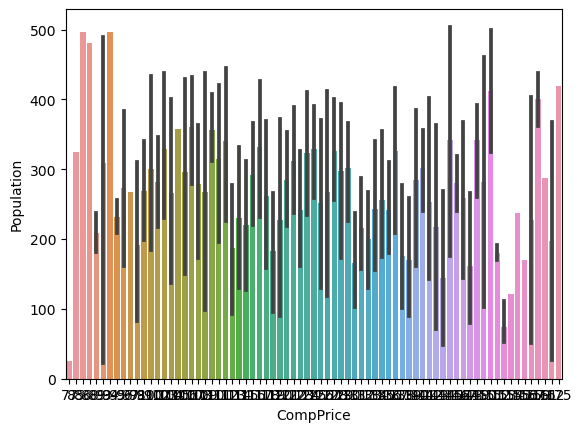

In [25]:
sns.barplot(data=company_data,x=company_data['CompPrice'],y=company_data['Population'])

<AxesSubplot:xlabel='ShelveLoc', ylabel='count'>

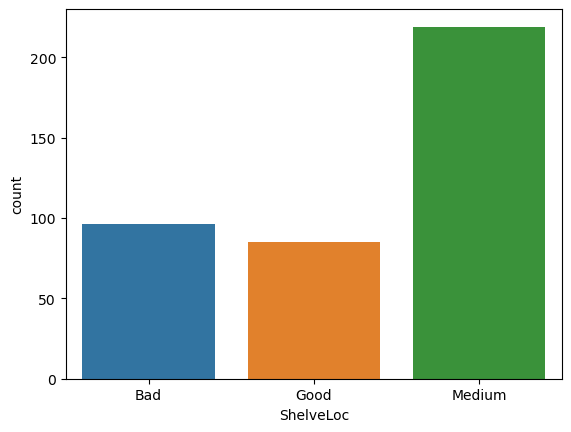

In [26]:
sns.countplot(data=company_data,x='ShelveLoc')

<AxesSubplot:xlabel='ShelveLoc', ylabel='Price'>

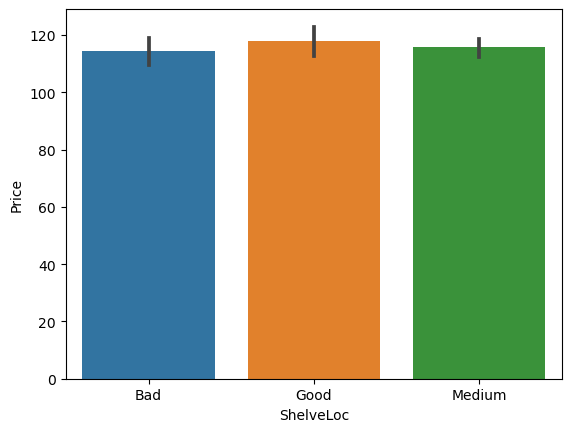

In [27]:
sns.barplot(data=company_data,x='ShelveLoc',y='Price')

In [28]:
company_data.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
395    False
396    False
397    False
398    False
399    False
Length: 400, dtype: bool

In [29]:
#Creating dummy vairables dropping first dummy variable
company_data=pd.get_dummies(company_data,columns=['Urban','US'], drop_first=True)

In [30]:
company_data

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,Bad,42,17,1,1
1,11.22,111,48,16,260,83,Good,65,10,1,1
2,10.06,113,35,10,269,80,Medium,59,12,1,1
3,7.40,117,100,4,466,97,Medium,55,14,1,1
4,4.15,141,64,3,340,128,Bad,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,1,1
396,6.14,139,23,3,37,120,Medium,55,11,0,1
397,7.41,162,26,12,368,159,Medium,40,18,1,1
398,5.94,100,79,7,284,95,Bad,50,12,1,1


In [31]:
company_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban_Yes    400 non-null    uint8  
 10  US_Yes       400 non-null    uint8  
dtypes: float64(1), int64(7), object(1), uint8(2)
memory usage: 29.0+ KB


In [32]:
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

In [33]:
company_data['ShelveLoc']=company_data['ShelveLoc'].map({'Good':1,'Medium':2,'Bad':3})

In [34]:
company_data.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,3,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,3,38,13,1,0


In [35]:
x=company_data.iloc[:,0:6]
y=company_data['ShelveLoc']

In [36]:
x

,Sales,CompPrice,Income,Advertising,Population,Price
0,9.50,138,73,11,276,120
1,11.22,111,48,16,260,83
2,10.06,113,35,10,269,80
3,7.40,117,100,4,466,97
4,4.15,141,64,3,340,128
...,...,...,...,...,...,...
395,12.57,138,108,17,203,128
396,6.14,139,23,3,37,120
397,7.41,162,26,12,368,159
398,5.94,100,79,7,284,95


In [37]:
y

0      3
1      1
2      2
3      2
4      3
      ..
395    1
396    2
397    2
398    3
399    1
Name: ShelveLoc, Length: 400, dtype: int64

In [38]:

company_data['ShelveLoc'].unique()

array([3, 1, 2], dtype=int64)

In [39]:
company_data.ShelveLoc.value_counts()

2    219
3     96
1     85
Name: ShelveLoc, dtype: int64

In [40]:
colnames = list(company_data.columns)
colnames

['Sales',
 'CompPrice',
 'Income',
 'Advertising',
 'Population',
 'Price',
 'ShelveLoc',
 'Age',
 'Education',
 'Urban_Yes',
 'US_Yes']

In [41]:
# Splitting data into training and testing data set
x_train, x_test,y_train,y_test = train_test_split(x,y, test_size=0.2,random_state=40)

In [42]:
x_train

,Sales,CompPrice,Income,Advertising,Population,Price
85,8.47,125,103,0,304,112
69,7.99,127,59,0,339,99
203,2.05,131,82,0,132,157
379,5.81,125,111,0,404,107
261,5.71,121,42,4,188,118
...,...,...,...,...,...,...
306,4.78,131,32,1,85,133
165,0.37,147,58,7,100,191
7,11.85,136,81,15,425,120
219,10.62,116,79,19,359,116


In [43]:
x_test

,Sales,CompPrice,Income,Advertising,Population,Price
132,9.54,125,87,9,232,136
390,5.47,108,75,9,61,111
310,9.53,175,65,29,419,166
3,7.40,117,100,4,466,97
248,5.36,111,52,0,12,101
...,...,...,...,...,...,...
361,8.68,131,25,10,183,104
197,2.52,124,61,0,333,138
23,5.87,121,31,0,292,109
54,4.90,134,103,13,25,144


In [44]:
y_train

85     2
69     2
203    3
379    3
261    2
      ..
306    2
165    3
7      1
219    1
326    2
Name: ShelveLoc, Length: 320, dtype: int64

In [45]:
y_test

132    1
390    2
310    2
3      2
248    2
      ..
361    2
197    2
23     2
54     2
58     3
Name: ShelveLoc, Length: 80, dtype: int64

# Building Decision Tree Classifier using Entropy Criteria

In [46]:
model = DecisionTreeClassifier(criterion = 'entropy',max_depth=5)
model.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [47]:
from sklearn import tree

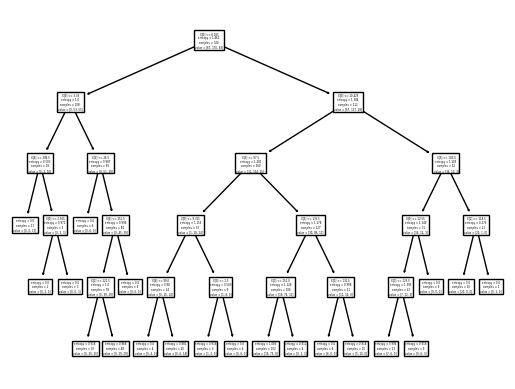

In [48]:
#PLot the decision tree
tree.plot_tree(model);

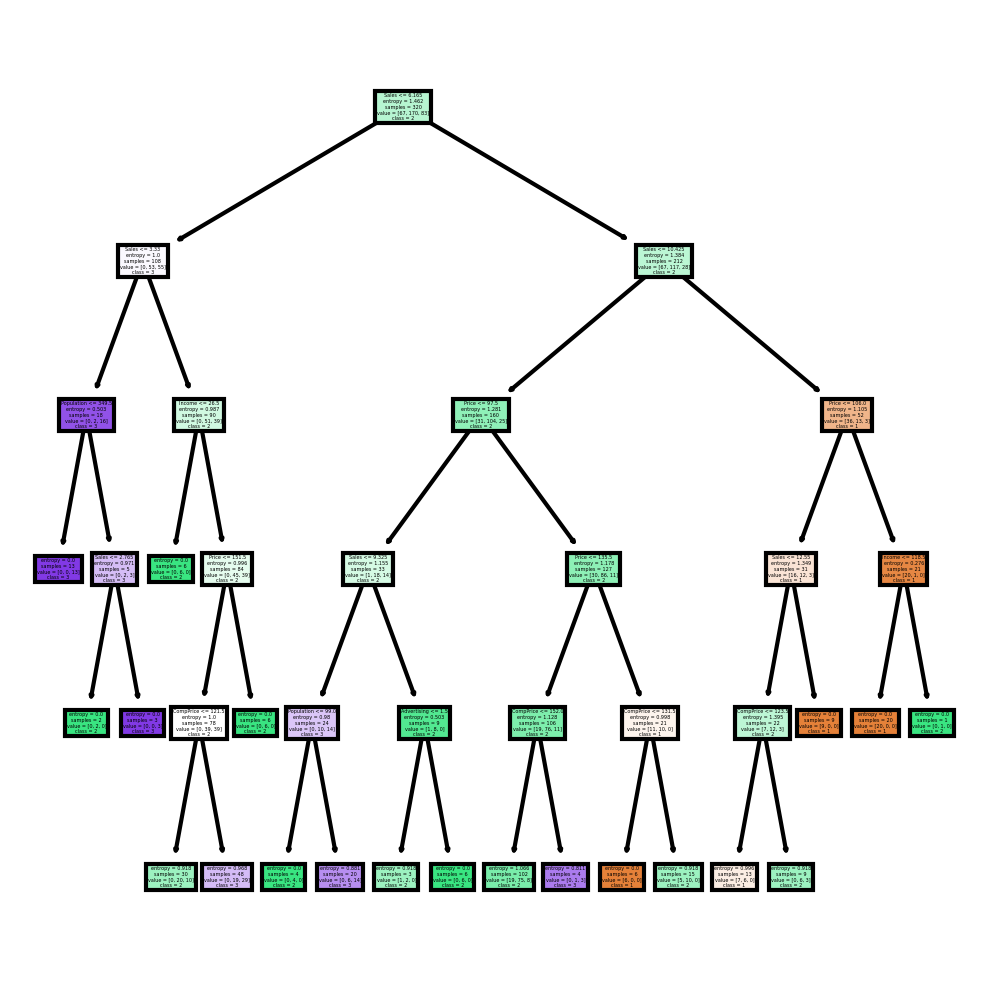

In [49]:
fn=['Sales','CompPrice','Income','Advertising','Population','Price']
cn=['1', '2', '3']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(model,
               feature_names = fn, 
               class_names=cn,
               filled = True);

In [50]:
#Predicting on test data
preds = model.predict(x_test) # predicting on test data set 
pd.Series(preds).value_counts() # getting the count of each category

2    43
3    25
1    12
dtype: int64

In [51]:
preds

array([1, 2, 2, 3, 2, 3, 2, 1, 2, 1, 2, 2, 2, 3, 1, 2, 2, 2, 3, 3, 2, 2,
       3, 2, 3, 2, 2, 3, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 3, 2, 1, 2, 3, 3,
       2, 3, 3, 2, 2, 2, 3, 2, 2, 3, 2, 1, 2, 3, 2, 3, 3, 2, 1, 2, 2, 2,
       2, 3, 3, 1, 2, 3, 3, 2, 3, 2, 3, 2, 3, 2], dtype=int64)

In [52]:
pd.crosstab(y_test,preds) # getting the 2 way table to understand the correct and wrong 

col_0,1,2,3
ShelveLoc,,,
1,9,9,0
2,3,27,19
3,0,7,6


In [53]:
# Accuracy 
np.mean(preds==y_test)

0.525

# Building Decision Tree Classifier (CART) using Gini Criteria

In [54]:
from sklearn.tree import DecisionTreeClassifier
model_gini = DecisionTreeClassifier(criterion='gini', max_depth=3)

In [55]:
model_gini.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [56]:
#Prediction and computing the accuracy
pred=model.predict(x_test)
np.mean(preds==y_test)

0.525

# Decision Tree Regression Example

In [57]:
# Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor

In [58]:
array = company_data.values
X = array[:,0:3]
y = array[:,3]

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)

In [60]:
X_train

array([[  7.68, 126.  ,  41.  ],
       [  6.88,  95.  ,  44.  ],
       [  4.17, 123.  ,  96.  ],
       [  4.21, 118.  ,  35.  ],
       [  6.56, 117.  ,  42.  ],
       [  6.5 , 108.  ,  69.  ],
       [  8.87, 131.  , 113.  ],
       [ 16.27, 141.  ,  60.  ],
       [ 11.17, 107.  , 117.  ],
       [  3.63, 122.  ,  74.  ],
       [  8.19, 127.  , 103.  ],
       [ 10.27, 125.  , 103.  ],
       [  6.62, 132.  , 118.  ],
       [  4.42, 121.  ,  90.  ],
       [  6.67, 116.  ,  99.  ],
       [  4.69, 132.  , 113.  ],
       [ 10.07, 130.  , 100.  ],
       [  7.58, 118.  ,  32.  ],
       [ 10.5 , 122.  ,  21.  ],
       [  9.5 , 138.  ,  73.  ],
       [  5.55, 104.  , 100.  ],
       [ 12.11, 118.  , 117.  ],
       [  9.39, 117.  , 118.  ],
       [  7.5 , 140.  ,  29.  ],
       [  9.46,  89.  ,  81.  ],
       [  6.59, 109.  ,  73.  ],
       [ 10.49, 122.  ,  84.  ],
       [  7.78,  86.  ,  54.  ],
       [  5.68, 130.  ,  64.  ],
       [  5.04, 123.  , 114.  ],
       [  

In [61]:
X_test

array([[5.940e+00, 1.000e+02, 7.900e+01],
       [9.340e+00, 8.900e+01, 7.800e+01],
       [3.150e+00, 1.170e+02, 6.600e+01],
       [1.154e+01, 1.340e+02, 4.400e+01],
       [9.030e+00, 1.040e+02, 1.020e+02],
       [7.810e+00, 1.370e+02, 1.020e+02],
       [2.520e+00, 1.240e+02, 6.100e+01],
       [6.640e+00, 1.180e+02, 7.000e+01],
       [7.810e+00, 1.040e+02, 9.900e+01],
       [6.970e+00, 1.060e+02, 4.600e+01],
       [0.000e+00, 1.390e+02, 2.400e+01],
       [7.800e+00, 1.210e+02, 5.000e+01],
       [8.070e+00, 1.160e+02, 3.700e+01],
       [2.660e+00, 1.360e+02, 6.500e+01],
       [7.520e+00, 1.230e+02, 3.900e+01],
       [8.690e+00, 1.130e+02, 6.400e+01],
       [9.080e+00, 1.520e+02, 8.100e+01],
       [1.081e+01, 1.240e+02, 1.130e+02],
       [4.430e+00, 1.340e+02, 4.800e+01],
       [3.450e+00, 1.100e+02, 4.500e+01],
       [6.880e+00, 1.190e+02, 1.000e+02],
       [4.680e+00, 1.240e+02, 4.600e+01],
       [4.950e+00, 1.210e+02, 2.800e+01],
       [4.830e+00, 1.150e+02, 1.15

In [62]:
y_test

array([ 7.,  0.,  1.,  4., 13., 13.,  0.,  0., 15., 11.,  0.,  0.,  0.,
        4.,  5., 10.,  0., 13.,  1.,  9.,  5.,  0., 19.,  3., 13.,  0.,
       11.,  0., 10.,  0.,  0.,  3.,  7., 11.,  0., 16., 15.,  0., 12.,
       10.,  0.,  0., 12.,  0., 13.,  0.,  8.,  0., 10.,  2.,  0.,  0.,
        0.,  0., 13., 11.,  0.,  0.,  0.,  7.,  0., 14., 11., 20.,  1.,
        6.,  0., 29.,  0.,  5., 12., 10., 17., 14.,  4.,  0.,  0., 15.,
        9.,  0.,  0.,  0., 17., 11.,  0.,  0., 21.,  5.,  0.,  3.,  0.,
        0.,  0.,  0.,  5.,  1., 12., 25.,  8.,  5.,  4.,  0.,  3.,  0.,
        3., 12., 10., 18.,  0., 10.,  8.,  0., 24.,  0.,  0., 11., 10.,
        0.,  0., 17.,  0.,  0.,  0.,  0., 16.,  4., 11.,  2., 13.,  0.,
        7.,  0.])

In [63]:
y_train

array([22.,  4., 10., 14.,  7.,  3.,  0., 19., 11.,  0.,  0., 12., 12.,
        0.,  5.,  0., 11.,  0., 16., 11.,  8., 18., 14.,  0., 15.,  0.,
        8.,  0.,  0.,  0.,  3., 11.,  5.,  0.,  0.,  0., 13.,  0.,  0.,
       13.,  0., 11.,  0.,  9., 12., 11.,  0.,  7.,  0.,  0., 14.,  7.,
       10., 16.,  0.,  1.,  8.,  6.,  0., 16.,  0.,  2.,  0., 15.,  0.,
        0.,  0.,  0.,  0.,  3., 20.,  9., 12.,  0., 16.,  5., 13., 12.,
        2.,  0., 15., 14.,  0., 13.,  7., 11., 16., 10.,  8.,  3., 14.,
       10.,  0.,  0., 18.,  4., 10.,  9., 18.,  0.,  0.,  0., 20.,  0.,
       11.,  0., 19., 26.,  0., 12.,  0.,  0.,  0., 13.,  5., 15.,  0.,
       16., 11.,  0.,  7.,  1.,  0., 10.,  0., 19.,  0., 10.,  0.,  0.,
        0.,  0.,  8.,  3., 16.,  0.,  5.,  9.,  2.,  0., 12.,  0., 13.,
        9., 18.,  5.,  4., 17.,  0., 15., 13., 14., 19.,  5.,  7., 10.,
        0.,  4.,  0.,  0.,  9.,  0., 10.,  2.,  0.,  0.,  1.,  0., 11.,
        2., 12., 23.,  0., 12.,  6., 19., 13.,  4., 10.,  3., 15

In [64]:
model = DecisionTreeRegressor()
model.fit(X_train, y_train)

DecisionTreeRegressor()

In [65]:
#Find the accuracy
model.score(X_test,y_test)

-1.2869739295210736

# 2)Fraud Check

Problem Statement


Use decision trees to prepare a model on fraud data 
treating those who have taxable_income <= 30000 as "Risky" and others are "Good"

Data Description :

Undergrad : person is under graduated or not
Marital.Status : marital status of a person
Taxable.Income : Taxable income is the amount of how much tax an individual owes to the government 
Work Experience : Work experience of an individual person
Urban : Whether that person belongs to urban area or not

In [66]:
#Importing DataSet

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import LabelEncoder#for encoding
from sklearn.model_selection import train_test_split#for train test splitting
from sklearn.tree import DecisionTreeClassifier#for decision tree object
from sklearn.metrics import classification_report, confusion_matrix#for checking testing results
from sklearn.tree import plot_tree#for visualizing tree 
import warnings
warnings.filterwarnings('ignore')

In [68]:
fraud_check = pd.read_csv("D:\ExcelR Solution\Data Science\Assignments\Assignment No-14-Decision Trees\Fraud_check.csv")

In [69]:
fraud_check

,Undergrad,Marital.Status,Taxable.Income,City.Population,Work.Experience,Urban
0,NO,Single,68833,50047,10,YES
1,YES,Divorced,33700,134075,18,YES
2,NO,Married,36925,160205,30,YES
3,YES,Single,50190,193264,15,YES
4,NO,Married,81002,27533,28,NO
...,...,...,...,...,...,...
595,YES,Divorced,76340,39492,7,YES
596,YES,Divorced,69967,55369,2,YES
597,NO,Divorced,47334,154058,0,YES
598,YES,Married,98592,180083,17,NO


In [70]:
fraud_check.head()

,Undergrad,Marital.Status,Taxable.Income,City.Population,Work.Experience,Urban
0,NO,Single,68833,50047,10,YES
1,YES,Divorced,33700,134075,18,YES
2,NO,Married,36925,160205,30,YES
3,YES,Single,50190,193264,15,YES
4,NO,Married,81002,27533,28,NO


In [71]:
#getting information of dataset
fraud_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600 entries, 0 to 599
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Undergrad        600 non-null    object
 1   Marital.Status   600 non-null    object
 2   Taxable.Income   600 non-null    int64 
 3   City.Population  600 non-null    int64 
 4   Work.Experience  600 non-null    int64 
 5   Urban            600 non-null    object
dtypes: int64(3), object(3)
memory usage: 28.2+ KB


In [72]:
fraud_check.shape

(600, 6)

In [73]:
fraud_check.isnull().any()

Undergrad          False
Marital.Status     False
Taxable.Income     False
City.Population    False
Work.Experience    False
Urban              False
dtype: bool

In [74]:
fraud_check.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
595    False
596    False
597    False
598    False
599    False
Length: 600, dtype: bool

In [75]:
fraud_check.dtypes

Undergrad          object
Marital.Status     object
Taxable.Income      int64
City.Population     int64
Work.Experience     int64
Urban              object
dtype: object

In [76]:
fraud_check.describe()

,Taxable.Income,City.Population,Work.Experience
count,600.000000,600.000000,600.000000
mean,55208.375000,108747.368333,15.558333
std,26204.827597,49850.075134,8.842147
min,10003.000000,25779.000000,0.000000
25%,32871.500000,66966.750000,8.000000
50%,55074.500000,106493.500000,15.000000
75%,78611.750000,150114.250000,24.000000
max,99619.000000,199778.000000,30.000000


In [77]:
fraud_check.isnull().sum()

Undergrad          0
Marital.Status     0
Taxable.Income     0
City.Population    0
Work.Experience    0
Urban              0
dtype: int64

In [78]:
fraud_check.columns


Index(['Undergrad', 'Marital.Status', 'Taxable.Income', 'City.Population',
       'Work.Experience', 'Urban'],
      dtype='object')

In [79]:
#Renaming Columns.

fraud_check = fraud_check.rename(columns={'Marital.Status':'Marital Status','Taxable.Income':'Taxable Income','City.Population':'City Population','Work.Experience':'Work Experience'}, index={'ONE': 'Row_1'})

In [80]:
fraud_check

,Undergrad,Marital Status,Taxable Income,City Population,Work Experience,Urban
0,NO,Single,68833,50047,10,YES
1,YES,Divorced,33700,134075,18,YES
2,NO,Married,36925,160205,30,YES
3,YES,Single,50190,193264,15,YES
4,NO,Married,81002,27533,28,NO
...,...,...,...,...,...,...
595,YES,Divorced,76340,39492,7,YES
596,YES,Divorced,69967,55369,2,YES
597,NO,Divorced,47334,154058,0,YES
598,YES,Married,98592,180083,17,NO


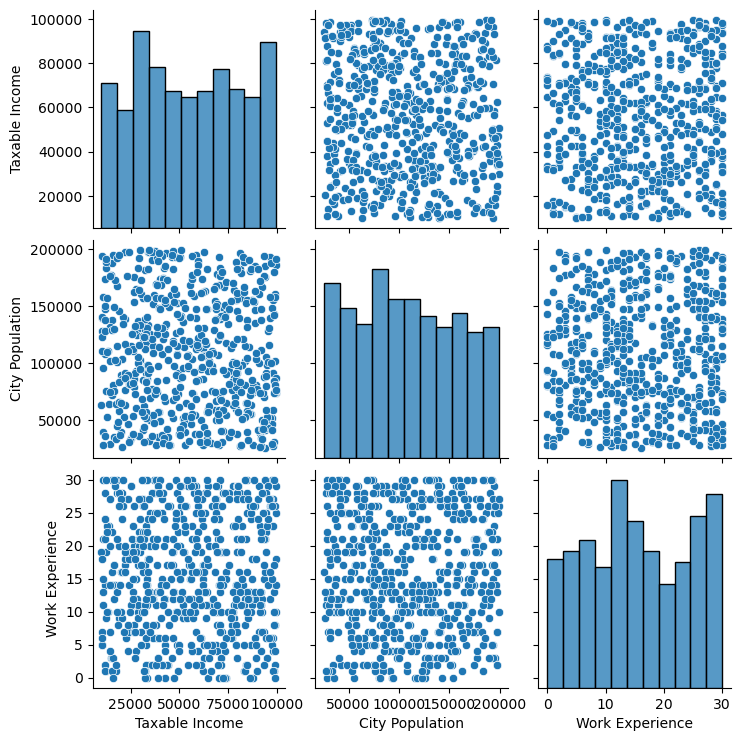

In [81]:
# let's plot pair plot to visualise the attributes all at once
import seaborn as sns
sns.pairplot(data=fraud_check)

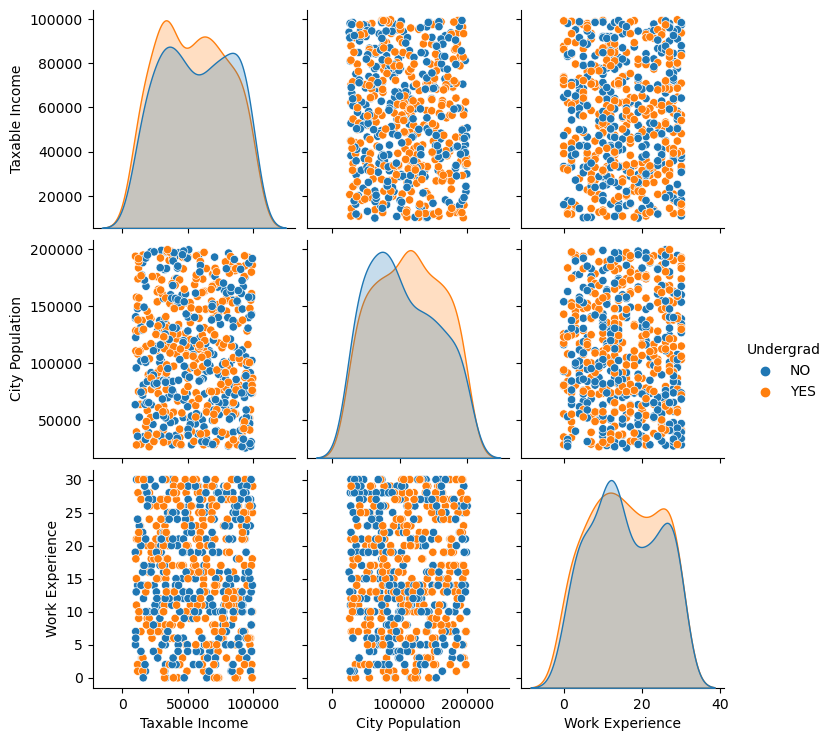

In [82]:
# let's plot pair plot to visualise the attributes all at once
sns.pairplot(data=fraud_check, hue ='Undergrad')

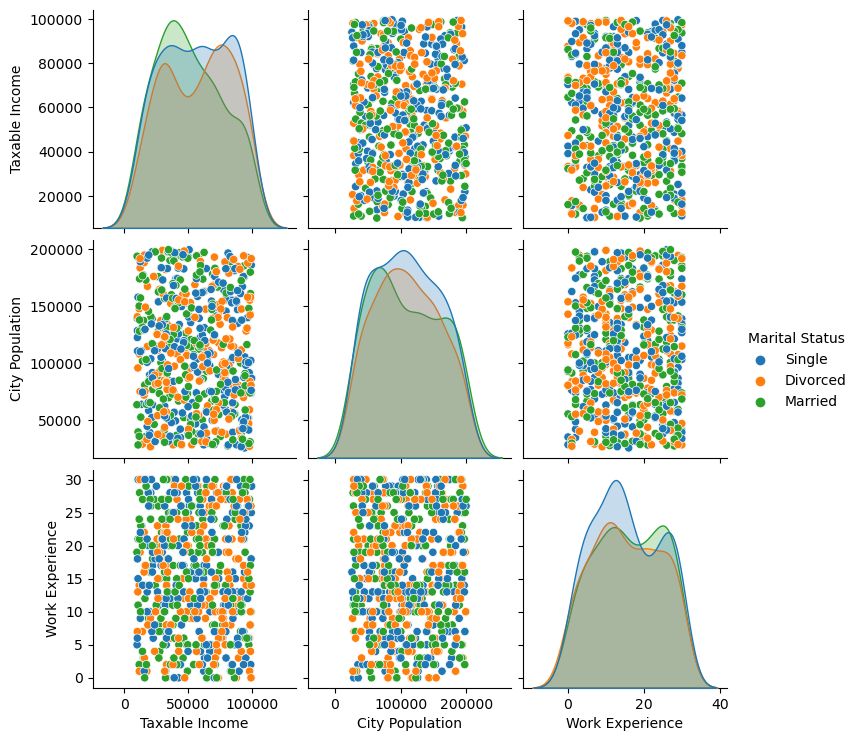

In [83]:
sns.pairplot(data=fraud_check, hue ='Marital Status')

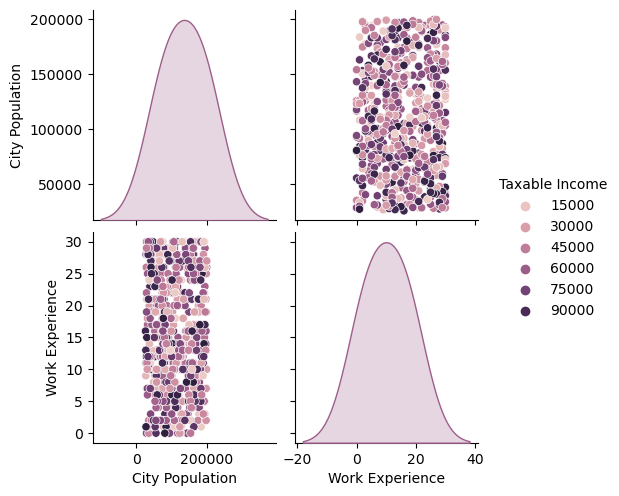

In [84]:
sns.pairplot(data=fraud_check, hue ='Taxable Income')

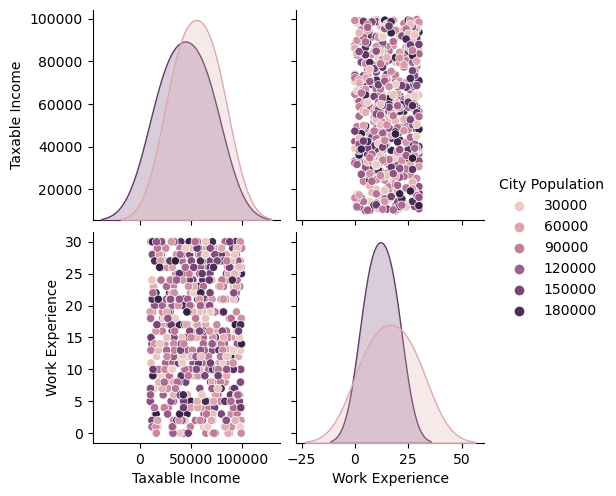

In [85]:
sns.pairplot(data=fraud_check, hue ='City Population')

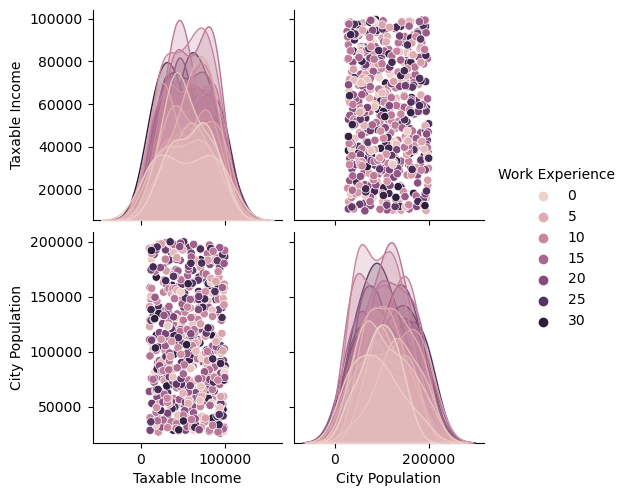

In [86]:
sns.pairplot(data=fraud_check, hue ='Work Experience')

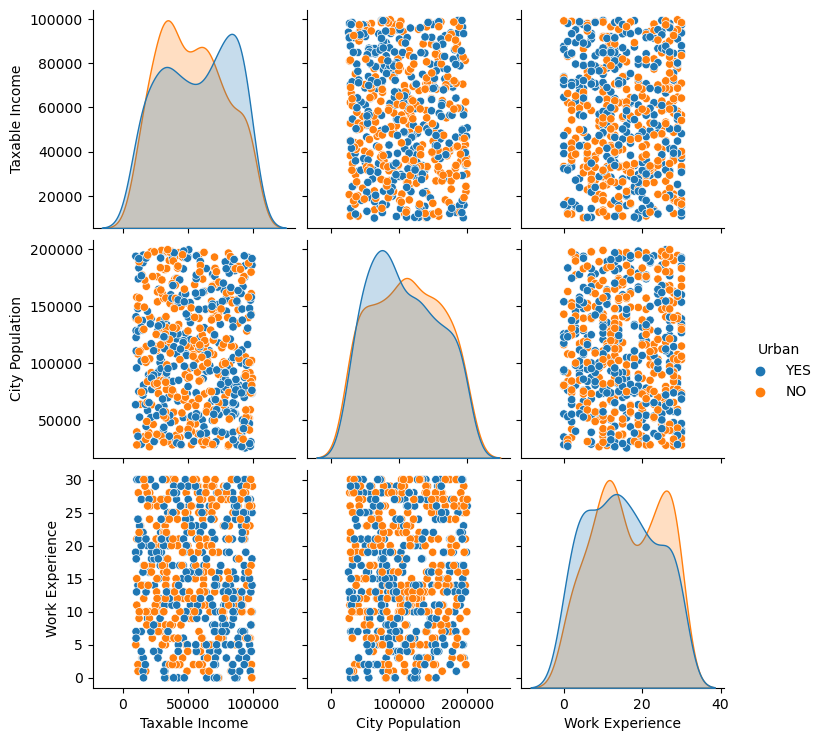

In [87]:
sns.pairplot(data=fraud_check, hue ='Urban')

<AxesSubplot:xlabel='Undergrad', ylabel='City Population'>

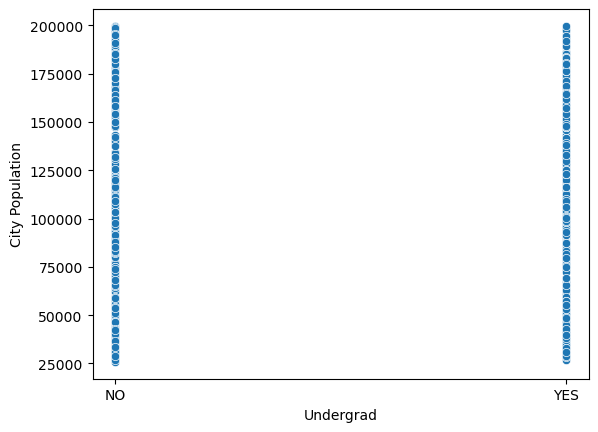

In [88]:
sns.scatterplot(data=fraud_check,x='Undergrad',y='City Population')

<AxesSubplot:xlabel='Work Experience', ylabel='City Population'>

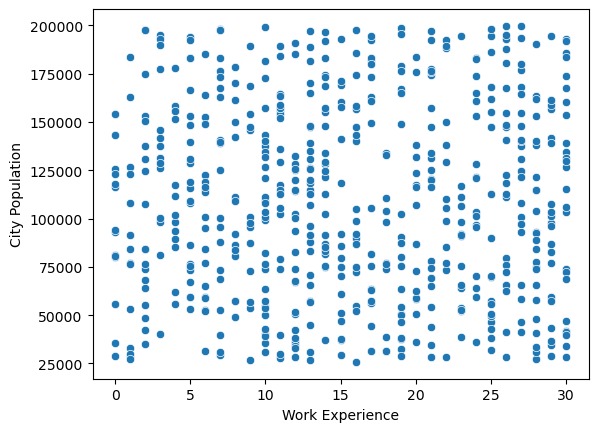

In [89]:
sns.scatterplot(data=fraud_check,x='Work Experience',y='City Population')

<AxesSubplot:xlabel='Marital Status', ylabel='City Population'>

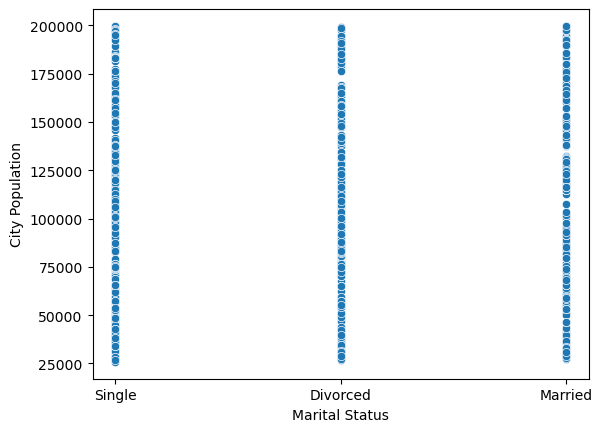

In [90]:
sns.scatterplot(data=fraud_check,x='Marital Status',y='City Population')

<AxesSubplot:xlabel='City Population', ylabel='count'>

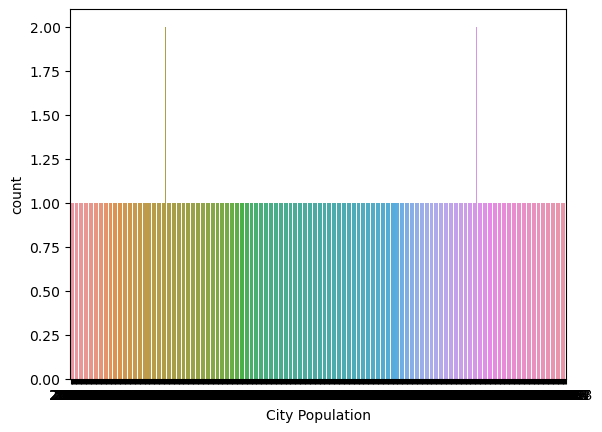

In [91]:
sns.countplot(data=fraud_check,x='City Population')

<AxesSubplot:xlabel='Work Experience', ylabel='count'>

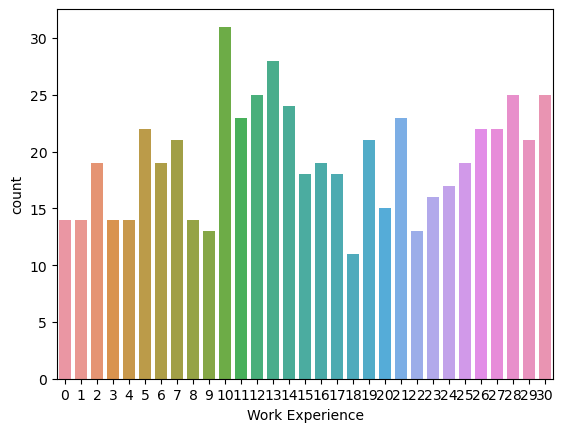

In [92]:
sns.countplot(data=fraud_check,x='Work Experience')

<AxesSubplot:xlabel='Taxable Income', ylabel='count'>

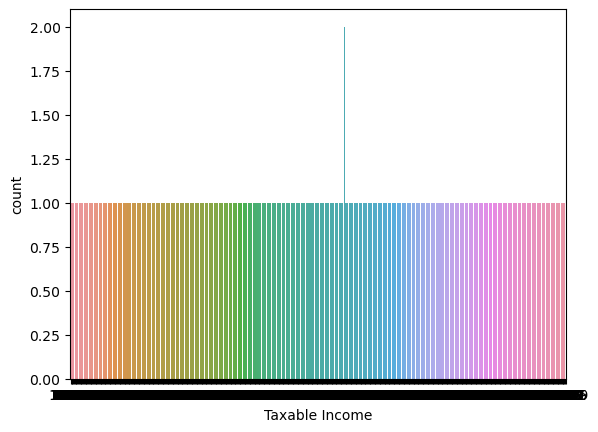

In [93]:
sns.countplot(data=fraud_check,x='Taxable Income')

<AxesSubplot:xlabel='Urban', ylabel='count'>

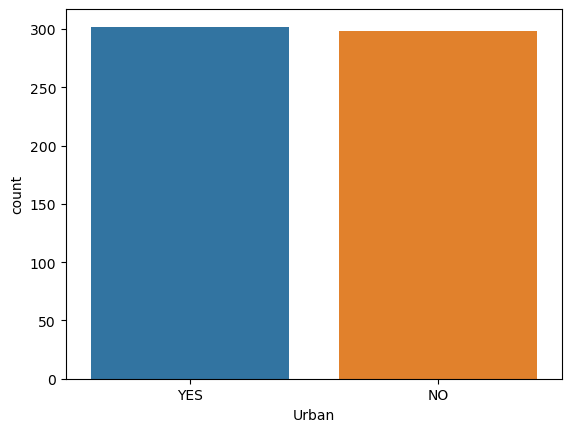

In [94]:
sns.countplot(data=fraud_check,x='Urban')

<AxesSubplot:xlabel='Undergrad', ylabel='count'>

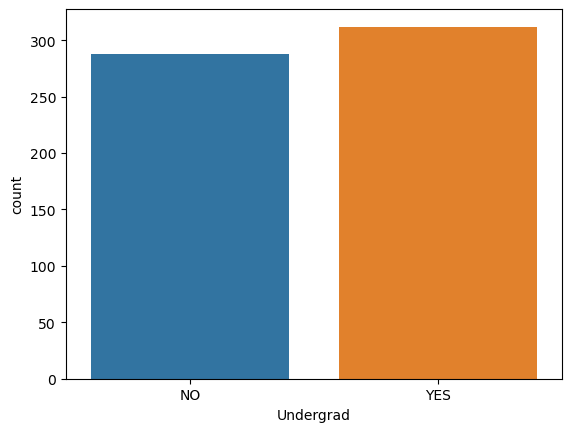

In [95]:
sns.countplot(data=fraud_check,x='Undergrad')

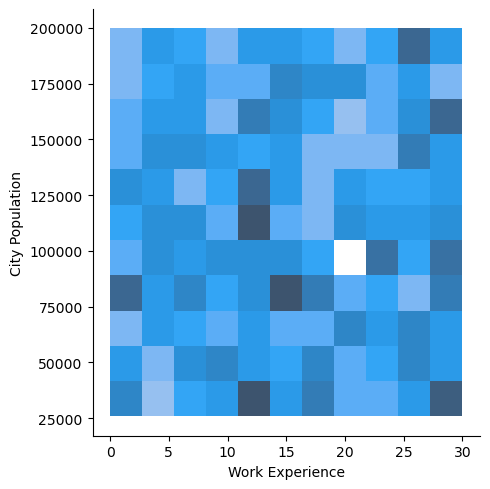

In [96]:
sns.displot(data=fraud_check,x='Work Experience',y='City Population')

<AxesSubplot:xlabel='Work Experience', ylabel='City Population'>

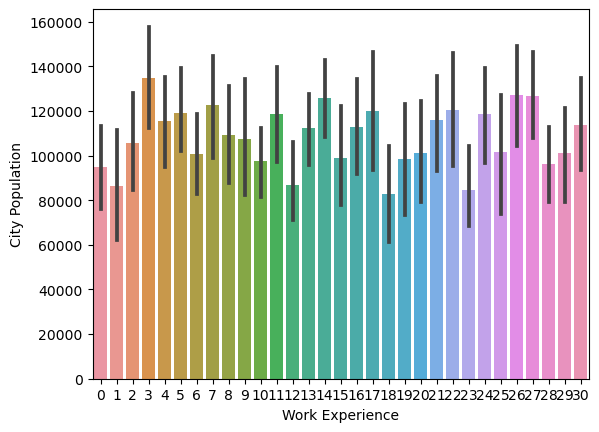

In [97]:
sns.barplot(data=fraud_check,x='Work Experience',y='City Population')

<AxesSubplot:xlabel='Taxable Income', ylabel='City Population'>

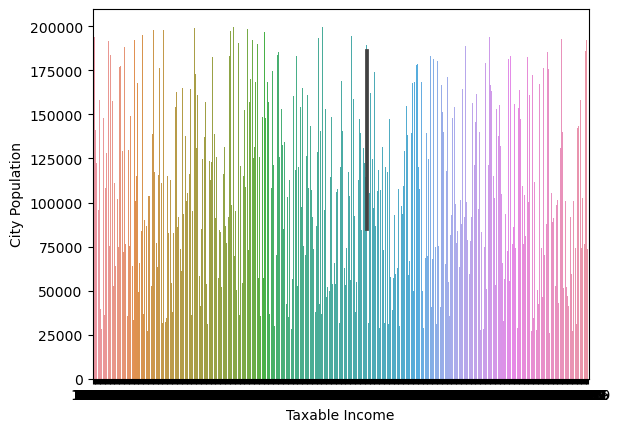

In [98]:
sns.barplot(data=fraud_check,x=fraud_check['Taxable Income'],y=fraud_check['City Population'])

In [99]:
#Creating dummy vairables dropping first dummy variable
fraud_check=pd.get_dummies(fraud_check,columns=['Urban','Undergrad'], drop_first=True)

In [100]:
fraud_check

,Marital Status,Taxable Income,City Population,Work Experience,Urban_YES,Undergrad_YES
0,Single,68833,50047,10,1,0
1,Divorced,33700,134075,18,1,1
2,Married,36925,160205,30,1,0
3,Single,50190,193264,15,1,1
4,Married,81002,27533,28,0,0
...,...,...,...,...,...,...
595,Divorced,76340,39492,7,1,1
596,Divorced,69967,55369,2,1,1
597,Divorced,47334,154058,0,1,0
598,Married,98592,180083,17,0,1


In [101]:
fraud_check.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 600 entries, 0 to 599
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Marital Status   600 non-null    object
 1   Taxable Income   600 non-null    int64 
 2   City Population  600 non-null    int64 
 3   Work Experience  600 non-null    int64 
 4   Urban_YES        600 non-null    uint8 
 5   Undergrad_YES    600 non-null    uint8 
dtypes: int64(3), object(1), uint8(2)
memory usage: 40.8+ KB


In [102]:
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

In [103]:
fraud_check['Marital Status']=fraud_check['Marital Status'].map({'Single':1,'Married':2,'Divorced':3})

In [104]:
fraud_check

,Marital Status,Taxable Income,City Population,Work Experience,Urban_YES,Undergrad_YES
0,1,68833,50047,10,1,0
1,3,33700,134075,18,1,1
2,2,36925,160205,30,1,0
3,1,50190,193264,15,1,1
4,2,81002,27533,28,0,0
...,...,...,...,...,...,...
595,3,76340,39492,7,1,1
596,3,69967,55369,2,1,1
597,3,47334,154058,0,1,0
598,2,98592,180083,17,0,1


In [105]:
x=fraud_check.iloc[:,0:3]
y=fraud_check['Work Experience']

In [106]:
x

,Marital Status,Taxable Income,City Population
0,1,68833,50047
1,3,33700,134075
2,2,36925,160205
3,1,50190,193264
4,2,81002,27533
...,...,...,...
595,3,76340,39492
596,3,69967,55369
597,3,47334,154058
598,2,98592,180083


In [107]:
y

0      10
1      18
2      30
3      15
4      28
       ..
595     7
596     2
597     0
598    17
599    16
Name: Work Experience, Length: 600, dtype: int64

In [108]:
fraud_check['Marital Status'].unique()

array([1, 3, 2], dtype=int64)

In [109]:
fraud_check.value_counts()

Marital Status  Taxable Income  City Population  Work Experience  Urban_YES  Undergrad_YES
1               10150           139642           5                0          0                1
2               93659           185596           30               1          1                1
                94413           89122            28               0          0                1
                94418           91138            23               0          1                1
                94528           80249            19               1          0                1
                                                                                             ..
1               93458           87730            7                1          1                1
                94013           25779            16               1          0                1
                94287           105680           22               0          0                1
                94772           52766        

In [110]:
colnames = list(fraud_check.columns)
colnames

['Marital Status',
 'Taxable Income',
 'City Population',
 'Work Experience',
 'Urban_YES',
 'Undergrad_YES']

In [111]:
# Splitting data into training and testing data set
x_train, x_test,y_train,y_test = train_test_split(x,y, test_size=0.2,random_state=1)

In [112]:
x_train

,Marital Status,Taxable Income,City Population
82,3,66564,111068
568,1,68617,150036
347,2,16082,80991
544,1,29916,133877
34,3,12514,183767
...,...,...,...
129,1,53378,65469
144,1,79453,156503
72,3,41344,108300
235,3,77735,87541


In [113]:
x_test

,Marital Status,Taxable Income,City Population
446,1,18888,65708
404,3,91545,34334
509,2,20309,65531
455,2,78400,65533
201,3,31088,58225
...,...,...,...
5,3,33329,116382
224,2,86784,55717
159,1,62209,28504
38,1,14912,177575


In [114]:
y_train

82     26
568    22
347     0
544    21
34      1
       ..
129    26
144    29
72     27
235     9
37      5
Name: Work Experience, Length: 480, dtype: int64

In [115]:
y_test

446    28
404    21
509    27
455    23
201    27
       ..
5       0
224    25
159     1
38      3
192    10
Name: Work Experience, Length: 120, dtype: int64

# Building Decision Tree Classifier using Entropy Criteria

In [116]:
model = DecisionTreeClassifier(criterion = 'entropy',max_depth=5)
model.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [117]:
from sklearn import tree

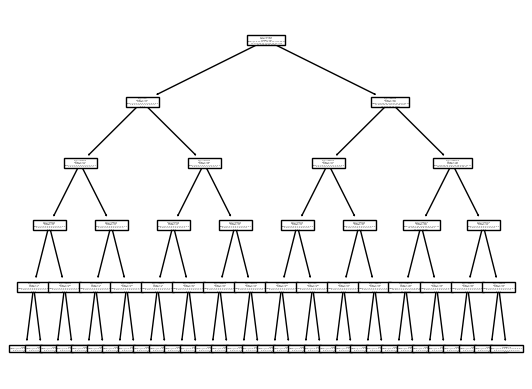

In [118]:
tree.plot_tree(model);

In [119]:
colnames = list(fraud_check.columns)
colnames

['Marital Status',
 'Taxable Income',
 'City Population',
 'Work Experience',
 'Urban_YES',
 'Undergrad_YES']

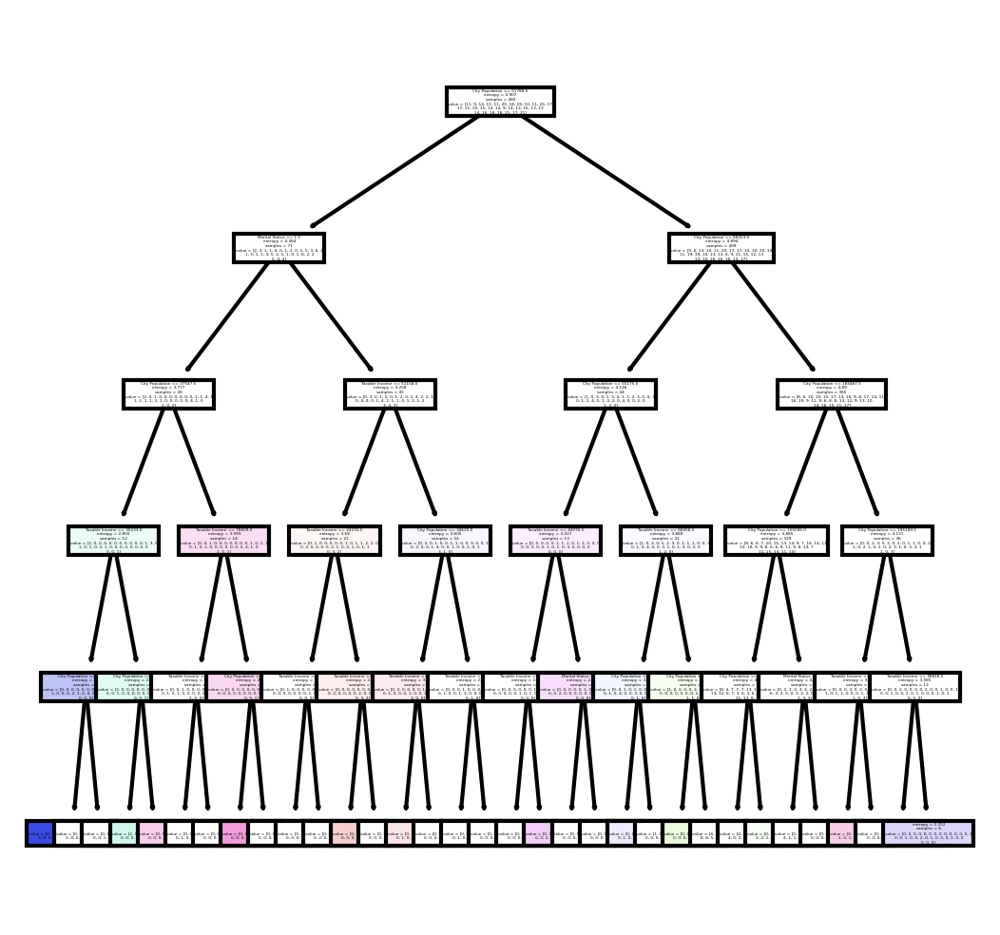

In [120]:
fn=['Marital Status','Taxable Income','City Population']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(model,
               feature_names = fn, 
               filled = True);

In [121]:
#Predicting on test data
preds = model.predict(x_test) # predicting on test data set 
pd.Series(preds).value_counts() # getting the count of each category

28    37
27    20
14    11
7      8
20     6
6      6
15     6
3      4
26     3
25     3
10     3
13     3
23     2
12     2
19     2
11     1
2      1
1      1
0      1
dtype: int64

In [122]:
preds

array([20, 28, 20,  6, 20, 25, 27, 27, 20, 15, 28, 25, 15, 27, 27,  7, 14,
       27, 28,  6, 28, 28, 28, 28, 19, 28, 27, 12,  3, 28, 14, 14, 27, 14,
        7, 15,  3, 14, 28, 28, 27, 27, 27, 20, 14, 14,  6, 28, 28, 28, 27,
       14, 28, 11, 13, 28, 28, 28, 27,  7,  6, 13, 28, 20, 28, 28, 13, 28,
       26, 10, 28, 28, 28, 28, 28, 15, 27, 27, 28, 26, 28, 28, 25, 27, 27,
       14,  6,  6,  2,  7, 27, 27, 15, 28,  3,  1, 14, 26, 14,  3, 23,  7,
        7, 10, 23, 28, 10, 27, 28, 28, 28, 19,  7, 28, 15, 28,  0, 12,  7,
       27], dtype=int64)

In [123]:
pd.crosstab(y_test,preds) # getting the 2 way table to understand the correct 

col_0,0,1,2,3,6,7,10,11,12,13,14,15,19,20,23,25,26,27,28
Work Experience,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,3
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,2,1
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1
4,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1
5,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1


In [124]:
# Accuracy 
np.mean(preds==y_test)

0.008333333333333333

# Building Decision Tree Classifier (CART) using Gini Criteria

In [125]:
from sklearn.tree import DecisionTreeClassifier
model_gini = DecisionTreeClassifier(criterion='gini', max_depth=3)

In [126]:
model_gini

DecisionTreeClassifier(max_depth=3)

In [127]:
model_gini.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [128]:
#Prediction and computing the accuracy
pred=model.predict(x_test)
np.mean(preds==y_test)

0.008333333333333333

# Decision Tree Regression Example

In [129]:
# Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor

In [130]:
array = fraud_check.values
X = array[:,0:3]
y = array[:,3]

In [131]:
X

array([[     1,  68833,  50047],
       [     3,  33700, 134075],
       [     2,  36925, 160205],
       ...,
       [     3,  47334, 154058],
       [     2,  98592, 180083],
       [     3,  96519, 158137]], dtype=int64)

In [132]:
y

array([10, 18, 30, 15, 28,  0,  8,  3, 12,  4, 19,  6, 14, 16, 13, 29, 29,
       25,  6, 30, 26,  7, 14, 12, 30, 27, 15, 12,  5, 30,  0, 21, 23, 21,
        1, 30,  5,  5,  3, 16, 26,  1, 12, 10, 22, 14, 27,  2, 12, 15,  3,
       30, 23,  7, 23, 16, 25, 13, 15, 11, 23,  8, 13,  9, 15, 29, 12, 24,
        5, 29,  3, 22, 27,  2, 17, 19, 11, 26,  0,  7, 26, 24, 26, 18,  4,
       12, 29, 23, 24, 20, 29, 10, 13,  3,  6, 28, 17, 19, 18, 12, 25, 20,
       23,  5, 14, 15, 20,  6, 10,  8, 19, 11, 26,  7,  7, 21, 12, 29, 10,
       30, 11, 16, 26, 26, 13, 11,  3, 28, 27, 26,  7, 16, 12, 14, 28, 19,
        9,  6, 25, 20,  4, 23, 26, 11, 29,  2, 28, 28, 21, 25, 28, 10, 16,
       28, 29,  7,  3,  5, 11,  1,  0, 30, 21, 15, 28, 23, 22, 25, 30,  6,
       10, 24, 23, 16,  8, 13, 28, 13, 15, 22, 19, 20,  4, 30, 15,  0, 19,
        5, 10, 11, 19,  7, 10, 25, 28, 13, 21,  4, 28,  9, 17, 27,  0,  4,
       14, 20, 16, 28,  3, 25, 13,  8, 14, 13, 16, 22, 22, 19, 19,  9, 30,
       14, 27, 17, 25,  0

In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)

In [134]:
X_train

array([[     1,  32786, 125771],
       [     3,  48940, 106946],
       [     3,  12453, 191874],
       ...,
       [     3,  41344, 108300],
       [     3,  77735,  87541],
       [     2,  68513,  66912]], dtype=int64)

In [135]:
X_test

array([[     1,  18888,  65708],
       [     3,  91545,  34334],
       [     2,  20309,  65531],
       [     2,  78400,  65533],
       [     3,  31088,  58225],
       [     1,  92040,  50495],
       [     3,  38626, 131493],
       [     3,  76535, 154393],
       [     2,  42507,  66985],
       [     2,  91304,  38463],
       [     1,  46470, 118274],
       [     1,  20109,  39360],
       [     1,  68833,  50047],
       [     2,  70743, 124440],
       [     2,  11784, 150349],
       [     1,  61906, 162777],
       [     3,  63057, 163252],
       [     1,  58496, 147367],
       [     3,  48640, 108262],
       [     3,  72151,  59382],
       [     2,  61830,  86649],
       [     2,  72115,  75436],
       [     1,  95088,  98378],
       [     1,  80239,  96432],
       [     1,  81231, 196816],
       [     1,  17962, 100961],
       [     1,  87935, 153748],
       [     1,  44034,  34964],
       [     2,  38374, 192297],
       [     2,  64614,  92975],
       [  

In [136]:
y_train

array([12, 20, 30, 27, 20, 25,  8, 19, 27, 13, 10, 30,  4,  5, 14, 26, 28,
        8, 22,  6, 12, 21,  5, 15, 15, 12,  0, 19,  4, 30, 12, 22, 30, 20,
        8,  7, 21, 14, 27, 20, 10,  0,  6, 30, 29, 30, 16, 13, 26,  8, 14,
       27,  0, 26, 26, 27, 12, 25,  3, 13, 27, 20, 21, 10, 25, 11,  5, 13,
       14, 27, 14, 25,  7, 26,  0, 26, 28, 22, 21, 26, 27, 28, 11,  3, 14,
       18, 29,  0,  0,  2, 28, 18, 11, 12, 20,  2,  5, 24, 17, 22, 26, 10,
       10, 18, 11, 10, 14,  5, 16, 27,  9, 30, 10, 24, 11,  8, 13,  6,  6,
        3, 16,  8,  4,  7,  5, 26, 25, 30,  4, 26,  4, 29,  1, 14, 29, 15,
       30, 14, 19, 30, 14, 28, 19, 28, 15,  2, 28,  6, 15, 25, 18, 16, 10,
       24, 15,  2,  5, 28, 22, 13, 19, 21, 13,  2, 13, 24, 13, 12, 24, 10,
        7,  1,  1,  9, 25, 30, 19, 30,  7, 17,  5, 17, 29,  7,  0, 11, 20,
       22, 10,  7, 14,  8, 10, 11,  6,  7,  3,  4, 12, 23, 12,  8,  9, 29,
       27,  5,  1, 10, 16,  3, 12,  6, 22, 12, 18, 10, 21, 30, 15,  9, 11,
       25, 17, 24,  9, 24

In [137]:
y_test

array([28, 21, 27, 23, 27, 12, 21,  9, 12, 23, 13, 10, 10, 14,  2, 17, 28,
       16, 10,  5, 16, 14,  3, 24, 14, 10, 30,  2, 17,  0,  8, 30, 11, 16,
       11, 21, 29, 29, 20, 11, 15, 28, 20, 12, 15, 19, 17, 18, 11, 19, 14,
       21,  1, 13,  8, 27,  8, 19, 13,  5, 24,  4, 29, 19,  4, 16, 25, 11,
       12, 19,  2, 26, 13,  1, 21, 30,  9, 12, 12, 27,  1, 16,  2, 18, 17,
       26, 24, 10,  7, 23,  2,  3, 12,  0, 15,  8,  4, 11, 21, 26,  1, 13,
       13,  7,  6, 12, 19, 19, 25, 28, 29, 26, 21, 13, 30,  0, 25,  1,  3,
       10, 26, 22,  0, 21,  1, 24, 13, 16, 14,  1, 22, 12, 17,  4, 25, 12,
       21, 17, 28, 24, 11, 17, 28, 18,  8,  2, 16, 11, 20, 23,  6,  5, 11,
       28,  5, 19, 10, 22, 30, 10, 23, 29, 14,  0, 10, 13,  6, 12, 23, 10,
       24, 14,  2, 16, 30, 16, 28, 14,  7, 27, 18, 16,  6, 13,  4, 20,  5,
       29, 29,  3, 21, 11, 23, 23,  6, 11, 28,  8], dtype=int64)

In [138]:
model = DecisionTreeRegressor()
model.fit(X_train, y_train)

DecisionTreeRegressor()

In [139]:
#Find the accuracy
model.score(X_test,y_test)

-1.3008739119169554